## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas
from sklearn import metrics
from sklearn.metrics import f1_score, recall_score, accuracy_score
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [2]:
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from sklearn.compose import ColumnTransformer
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

## Load Data

In [3]:
df = pd.read_csv('/Users/alexlei/Downloads/accepted_2007_to_2018Q4.csv', index_col=0, low_memory=False)

## Drop Columns

In [4]:
# Drop unnecessary columns
df = df.drop(df.loc[:, 'hardship_flag':'settlement_term'].columns, axis=1)
df = df.drop(['Total amount funded in policy code 1: 1465324575', 'Total amount funded in policy code 2: 521953170'])

## Fill Null Values

In [5]:
df = df.loc[df['loan_status'].notnull()]

In [6]:
df['fico_range_high'].fillna(df['fico_range_high'].mean(), inplace=True)

In [7]:
df['fico_range_low'].fillna(df['fico_range_low'].mean(), inplace=True)

In [8]:
# Fill Loan Status Null values

In [9]:
df['loan_status'].value_counts()

Fully Paid                                             1076751
Current                                                 878317
Charged Off                                             268559
Late (31-120 days)                                       21467
In Grace Period                                           8436
Late (16-30 days)                                         4349
Does not meet the credit policy. Status:Fully Paid        1988
Does not meet the credit policy. Status:Charged Off        761
Default                                                     40
Name: loan_status, dtype: int64

## Imputers

In [ ]:
# Fill Null values

In [ ]:
# mapping_loan_status = {
#     'Fully Paid': 1,
#     'Does not meet the credit policy. Status:Fully Paid': 1,
#     'Current': 0.75,
#     'Late (16-30 days)': 0.5,
#     'Late (31-120 days)': 0.25,
#     'In Grace Period': 0.25,
#     'Charged Off': 0,
#     'Default': 0,
#     'Does not meet the credit policy. Status:Charged Off': 0
# }

# df['loan_status'] = df['loan_status'].map(mapping_loan_status)

In [10]:
temp = df[['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 
    'installment', 'annual_inc', 'delinq_2yrs', 'fico_range_low', 
    'fico_range_high', 'inq_last_6mths', 'total_pymnt', 'total_rec_prncp',
   'tot_cur_bal', 'mort_acc']]

In [11]:
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')

In [12]:
imputer = imp_mean.fit(temp)
data = imputer.transform(temp)

## Assigning X & y

In [13]:
X = data
y = df['loan_status']

In [ ]:
# from sklearn import preprocessing
# from sklearn import utils

# #convert y values to categorical values
# lab = preprocessing.LabelEncoder()
# y_transformed = lab.fit_transform(y)

# #view transformed values
# print(y_transformed)

In [14]:
#Using train_test_split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

## Correlation Matrix

In [22]:
# X_y = X.copy()

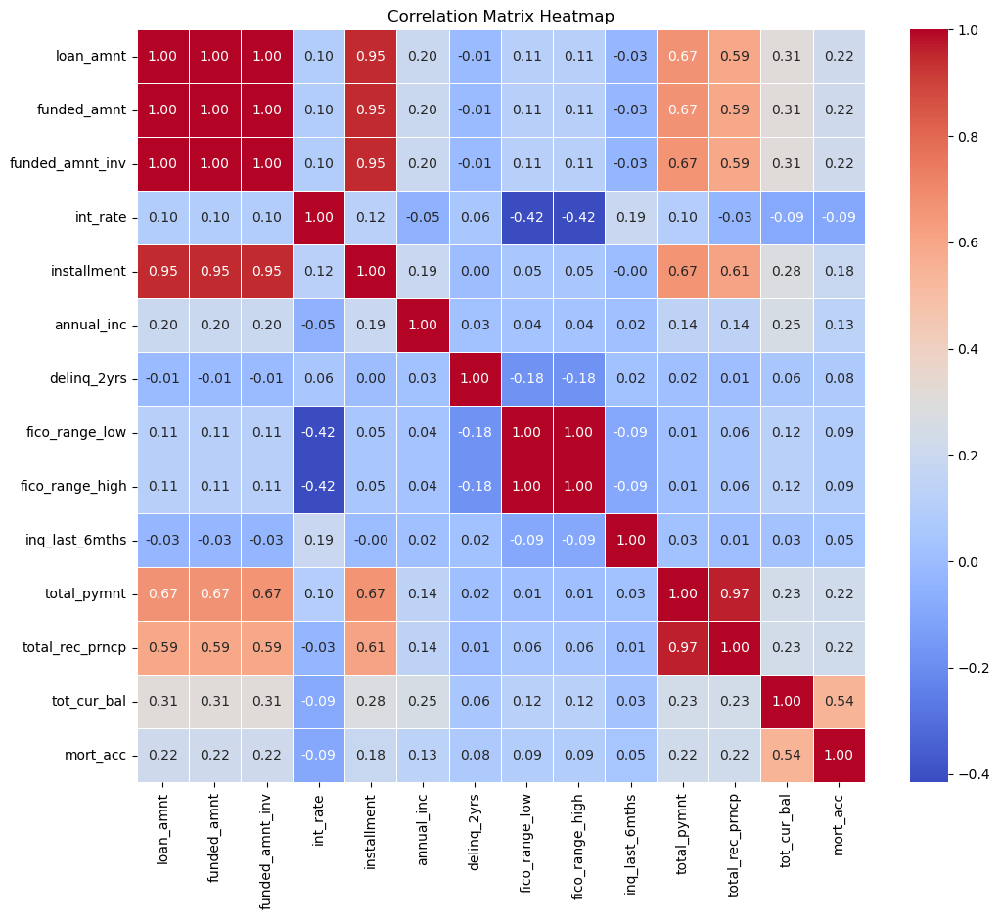

In [18]:
# Calculate the correlation matrix
correlation_matrix = temp.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Show the plot
plt.title("Correlation Matrix Heatmap")
plt.show()

In [19]:
# Loop over bottom diagonal of correlation matrix
for i in range(len(correlation_matrix.columns)):
    for j in range(i):

        # Print variables with high correlation
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            print(correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j])

funded_amnt loan_amnt 0.9997552688415985
funded_amnt_inv loan_amnt 0.9990379074333484
funded_amnt_inv funded_amnt 0.9993413348712905
installment loan_amnt 0.9456254486740845
installment funded_amnt 0.9459674813826888
installment funded_amnt_inv 0.9451179984314869
fico_range_high fico_range_low 0.9999999108557363
total_rec_prncp total_pymnt 0.9662220070242331


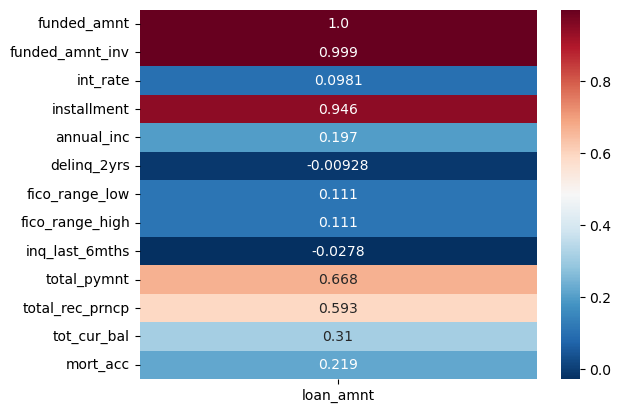

In [21]:
corr_matrix = temp.corr()

# Isolate the column corresponding to `loan_amnt`
corr_target = corr_matrix[['loan_amnt']].drop(labels=['loan_amnt'])

sns.heatmap(corr_target, annot=True, fmt='.3', cmap='RdBu_r')
plt.show()

## Plots for Correlations

In [23]:
df['loan_status'].value_counts().hvplot.bar(
    title="Loan Status Counts", xlabel='Loan Status', ylabel='Count', 
    width=500, height=350
)

:Bars   [index]   (loan_status)

<Axes: >

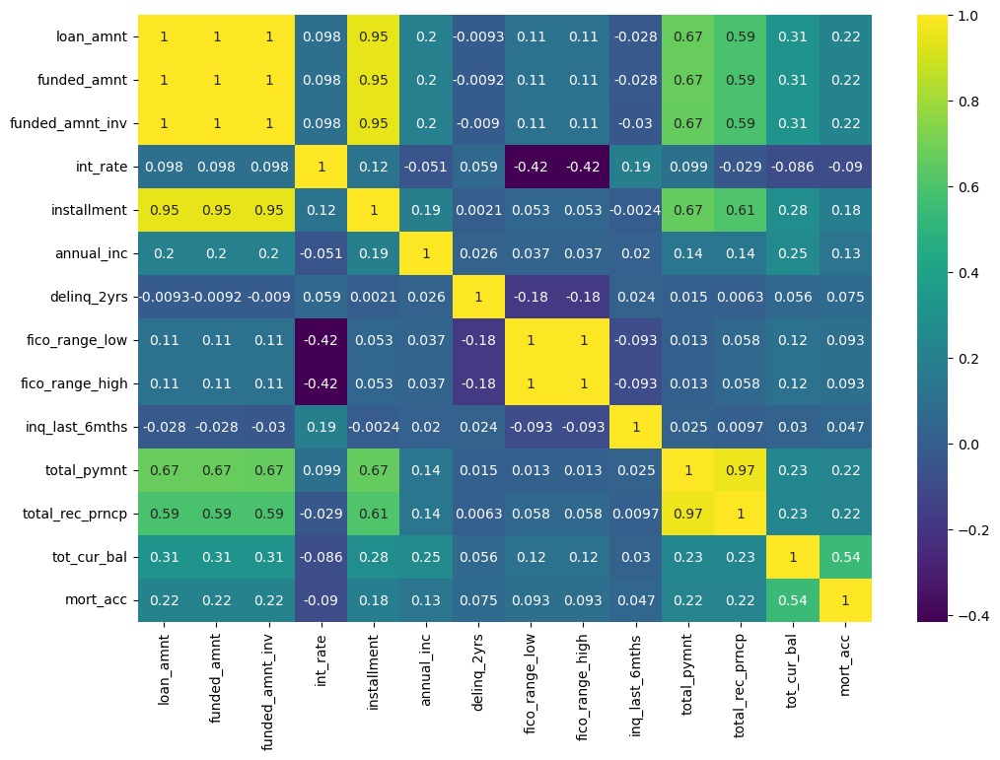

In [25]:
plt.figure(figsize=(12, 8))
sns.heatmap(temp.corr(), annot=True, cmap='viridis')

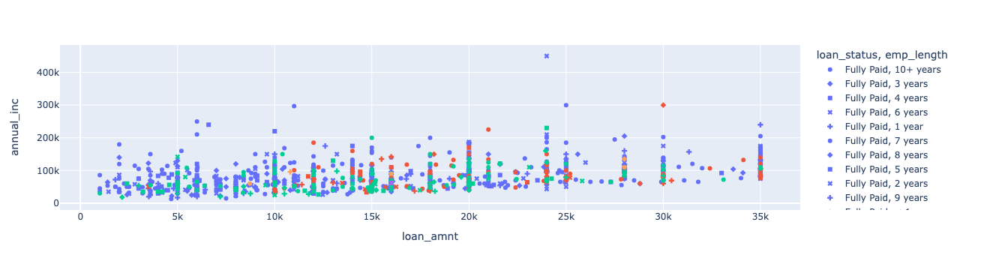

In [26]:
fig = px.scatter(df.head(1000), x='loan_amnt', y='annual_inc', color='loan_status', symbol='emp_length')
fig.show()

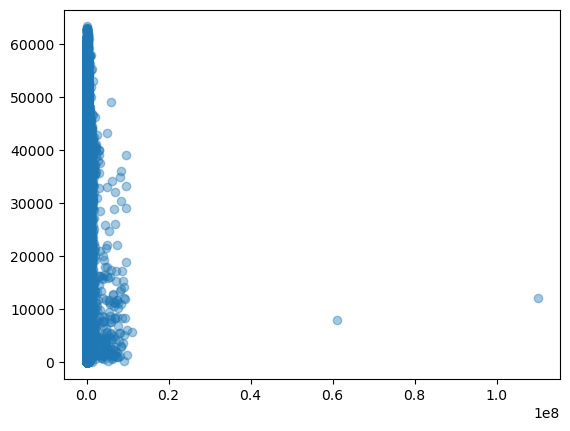

<Figure size 640x480 with 0 Axes>

In [27]:
# x_reshape = temp.values.reshape(-1,1)
plt.scatter(df['annual_inc'], df['total_pymnt'], alpha=0.4)
plt.show()
plt.clf()

In [30]:
installment = temp.hvplot.hist(
    y='installment', by='int_rate', subplots=False, 
    width=350, height=400, bins=50, alpha=0.4, 
    title="mort_acc by Loan Status", 
    xlabel='mort_acc', ylabel='Counts', legend='top'
)

loan_amnt = temp.hvplot.hist(
    y='loan_amnt', by='int_rate', subplots=False, 
    width=350, height=400, bins=30, alpha=0.4, 
    title="Loan Amount by Loan Status", 
    xlabel='Loan Amount', ylabel='Counts', legend='top'
)

installment + loan_amnt

:Layout
   .NdOverlay.I  :NdOverlay   [int_rate]
      :Histogram   [installment]   (installment_count)
   .NdOverlay.II :NdOverlay   [int_rate]
      :Histogram   [loan_amnt]   (loan_amnt_count)

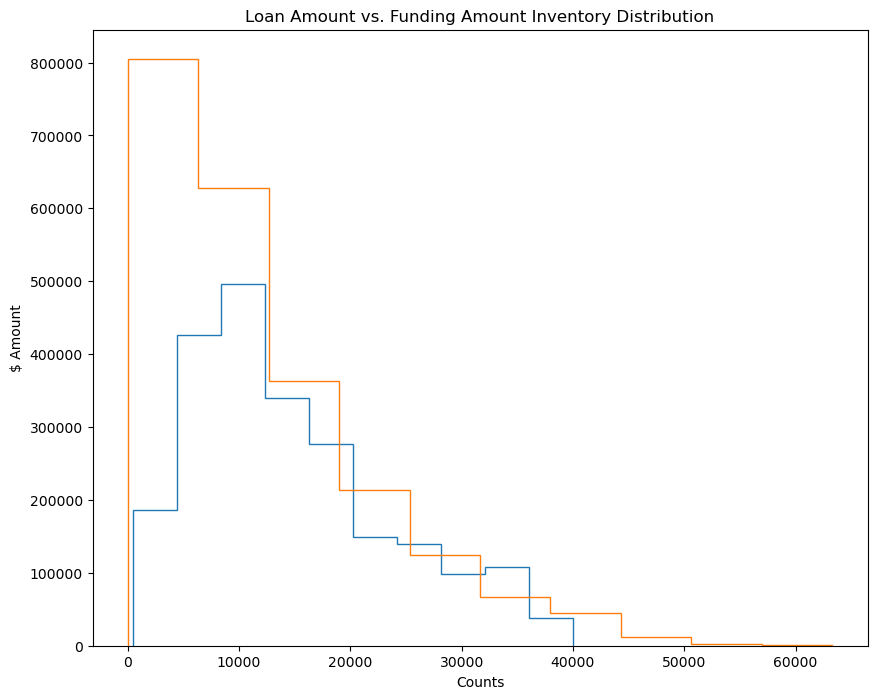

<Figure size 640x480 with 0 Axes>

In [31]:
plt.figure(figsize=(10, 8))
plt.hist(df['loan_amnt'], histtype ='step')
plt.hist(df['total_pymnt'], histtype ='step')

# plt.legend(["1st Yr Teaching", "2nd Yr Teaching"])
plt.title("Loan Amount vs. Funding Amount Inventory Distribution")
plt.xlabel("Counts")
plt.ylabel("$ Amount")
plt.show()
plt.clf()

## Creating LogisticRegression Model

In [32]:
# Transform X - Standard Scaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [33]:
# Create and train the model
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(solver='lbfgs', max_iter=1000)
model.fit(X_train, y_train)

/Users/alexlei/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(max_iter=1000)

## Predict and get Accuray for the Test data

In [34]:
y_pred = model.predict(X_test)
test_acc = accuracy_score(y_test, y_pred)
print('The Accuracy for Test Set is {}'.format(test_acc*100))

The Accuracy for Test Set is 87.89826723782528


## Making the Confusion Matrix

Text(0.5, 36.72222222222221, 'Predicted Values')

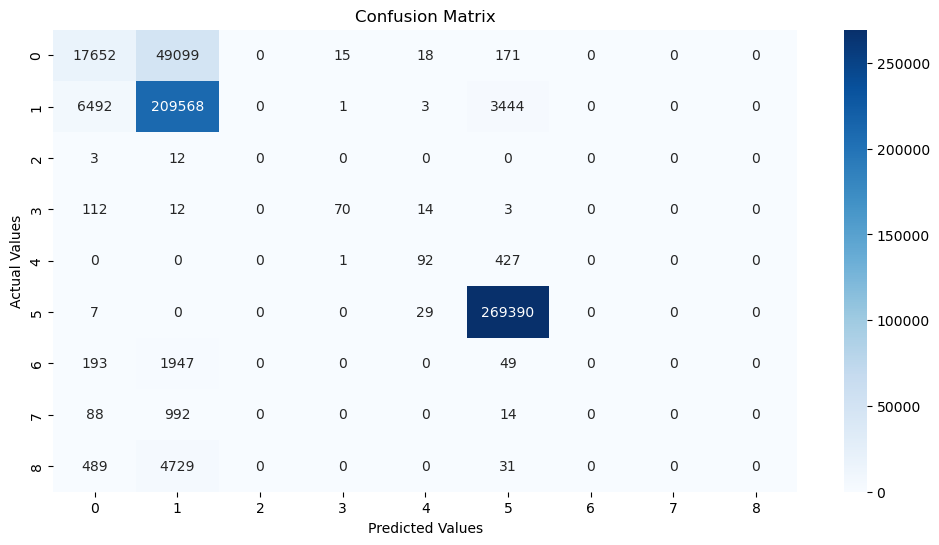

In [35]:
cm = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(12,6))
plt.title('Confusion Matrix')
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')

## Creating a classification report for the model

In [36]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

/Users/alexlei/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/alexlei/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



                                                     precision    recall  f1-score   support

                                        Charged Off       0.71      0.26      0.38     66955
                                            Current       0.79      0.95      0.86    219508
                                            Default       0.00      0.00      0.00        15
Does not meet the credit policy. Status:Charged Off       0.80      0.33      0.47       211
 Does not meet the credit policy. Status:Fully Paid       0.59      0.18      0.27       520
                                         Fully Paid       0.98      1.00      0.99    269426
                                    In Grace Period       0.00      0.00      0.00      2189
                                  Late (16-30 days)       0.00      0.00      0.00      1094
                                 Late (31-120 days)       0.00      0.00      0.00      5249

                                           accuracy                 

/Users/alexlei/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



## Sequential Backward Selection

In [ ]:
# model = LogisticRegression(solver='liblinear', max_iter=100)
# Using Sequential Backward Selection to identify the best 5 features

In [ ]:
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [ ]:
# Sequential backward selection
sfs = SFS(model, k_features=4, forward=False, floating=False, scoring='accuracy', cv=0)
# Fit the equential backward selection model
sfs.fit(X, y_transformed)

In [ ]:
# Print the chosen feature names
print(sfs.subsets_[4]['feature_names'])
# Print the accuracy of the model after sequential forward selection
print(sfs.subsets_[4]['avg_score'])
# data = df[['loan_amnt', 'annual_inc', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt', 'acc_now_delinq', 'inq_last_12m', 'mort_acc']]

In [ ]:
# Plot the model accuracy
plot_sfs(sfs.get_metric_dict())
plt.show()

## Autoencoder

In [37]:
# Define the # of input features (# of columns in 'df')
num_features = X.shape[1]
latent_dim = 10

In [38]:
np.count_nonzero(pd.isnull(X))

0

In [39]:
# input_data = Input(shape=(num_features,))
# # "encoded" is the encoded representation of the input
# encoded = Dense(latent_dim, activation='sigmoid')(input_data)
# encoded = Dropout(0.4)
# # "decoded" is the lossy reconstruction of the input
# decoded = Dense(num_features, activation='sigmoid')(encoded)
# decoded = Dropout(0.4)

In [40]:
# Define the encoder architecture
input_data = Input(shape=(num_features,))
encoded = Dense(20, activation='relu')(input_data)
encoded = Dense(latent_dim, activation='sigmoid')(encoded)
#encoded = Dropout(0.4)

In [41]:
# Define the decoder architecture
decoded = Dense(20, activation='sigmoid')(encoded)
decoded = Dense(num_features, activation='linear')(decoded)
#decoded = Dropout(0.2)

In [42]:
# Define the autoencoder model
autoencoder = Model(input_data, decoded)

In [43]:
# Compile the autoencoder model
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

In [44]:
# Train the autoencoder
autoencoder.fit(X, X, epochs=10, batch_size=10, shuffle=True)

Epoch 1/10
226067/226067 [==============================] - 92s 408us/step - loss: 4585382400.0000
Epoch 2/10
226067/226067 [==============================] - 91s 403us/step - loss: 4422238720.0000
Epoch 3/10
226067/226067 [==============================] - 91s 402us/step - loss: 4280347904.0000
Epoch 4/10
226067/226067 [==============================] - 91s 401us/step - loss: 4154345472.0000
Epoch 5/10
226067/226067 [==============================] - 89s 396us/step - loss: 4037945344.0000
Epoch 6/10
226067/226067 [==============================] - 89s 396us/step - loss: 3928522752.0000
Epoch 7/10
226067/226067 [==============================] - 85s 375us/step - loss: 3825107968.0000
Epoch 8/10
226067/226067 [==============================] - 86s 383us/step - loss: 3727495680.0000
Epoch 9/10
226067/226067 [==============================] - 89s 395us/step - loss: 3636422400.0000
Epoch 10/10
226067/226067 [==============================] - 84s 373us/step - loss: 3550955008.0000


In [45]:
# Extract the learned features from the encoder
encoder = Model(input_data, encoded)
encoded_data = encoder.predict(X)

70646/70646 [==============================] - 17s 237us/step


In [46]:
encoder.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 14)]              0         
                                                                 
 dense (Dense)               (None, 20)                300       
                                                                 
 dense_1 (Dense)             (None, 10)                210       
                                                                 
Total params: 510 (1.99 KB)
Trainable params: 510 (1.99 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [47]:
# Calculate reconstruction error for each column
reconstruction_errors = np.mean(np.square(data - autoencoder.predict(data)), axis=0)

70646/70646 [==============================] - 16s 230us/step


In [48]:
# Identify the column with the smallest reconstruction error (potential feature)
best_feature_index = np.argmin(reconstruction_errors)
best_feature_name = df.columns[best_feature_index]

In [49]:
print(f"The best feature to use as input is: {best_feature_name}")

The best feature to use as input is: installment


## Scoring the Model

In [50]:
y_pred = model.predict(X_test)

In [51]:
f1_score = metrics.f1_score(y_test, y_pred, average='weighted')
print(f1_score)

0.8539963654029893


In [52]:
accuracy_score = metrics.accuracy_score(y_test, y_pred)
print(accuracy_score)

0.8789826723782528


In [53]:
input_sample = temp.sample(1)
input_sample

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,total_pymnt,total_rec_prncp,tot_cur_bal,mort_acc
id,,,,,,,,,,,,,,
123007999,12000.0,12000.0,12000.0,21.45,327.69,62000.0,0.0,690.0,694.0,0.0,5228.74,2075.31,175078.0,1.0


In [54]:
prediction = model.predict(input_sample.values)
prediction

array(['In Grace Period'], dtype=object)

### No LabelEncoder on df['loan_status'], no Dropout in neither encoder and decoder
### Still need to work on pulling specific row from sample prediction + work on Deployment

### Below PCA shows NA in all component columns including the 'loan_status' column

## PCA

In [55]:
from sklearn.decomposition import PCA

In [56]:
pca = PCA(n_components=4)

principalComponents = pca.fit_transform(X)

principalDf = pd.DataFrame(data = principalComponents,
              columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4'])

In [59]:
finalDf = pd.concat([principalDf, df[['loan_status']]], axis = 1)

In [61]:
finalDf

,principal component 1,principal component 2,principal component 3,principal component 4,loan_status
0,-5671.143765,-22818.625007,21272.868262,3888.238836,NaN
1,55701.913069,-31359.215581,-23612.534124,6659.392586,NaN
2,40755.312337,-28785.407539,-14475.500140,7057.518412,NaN
3,162494.660595,-18620.784628,-34515.535806,-3327.542199,NaN
4,187706.056821,-33777.151566,13023.929816,5597.315532,NaN
...,...,...,...,...,...
89885898,NaN,NaN,NaN,NaN,Current
88977788,NaN,NaN,NaN,NaN,Current
88985880,NaN,NaN,NaN,NaN,Current
88224441,NaN,NaN,NaN,NaN,Charged Off


In [62]:
pca.explained_variance_ratio_

array([0.69547696, 0.29449333, 0.00811679, 0.00184805])

In [63]:
# Make an instance of the Model
pca = PCA(.95)

In [64]:
pca.fit(X_train)

PCA(n_components=0.95)

In [65]:
train_X = pca.transform(X_train)
test_X = pca.transform(X_test)

In [66]:
model.fit(train_X, y_train)

LogisticRegression(max_iter=1000)

In [67]:
model.score(test_X, y_test)

0.8269980377481346

## Testing

In [ ]:
input_sample = test_X.sample(1)
input_sample

In [ ]:
prediction = model.predict(test_X.values)
prediction